In [154]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import mapclassify
from shapely.geometry import Point, Polygon
import numpy as np
from shapely import *

# 数据预处理

## 读取并处理数据

In [49]:
df=pd.read_csv('orders_regions.csv')#读取表格数据
df_area=gpd.read_file(r'./CFS_AREA_shapefile_010215/CFS_AREA_shapefile_010215.shp')#读取地理信息数据

In [50]:
df.head()

,fr_orig,dms_orig,dms_dest,fr_dest,dms_mode,trade_type,tons_2012,tons_2013,tons_2014,tons_2015,...,value_2012,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045
0,NaN,41,41,NaN,1,1,9.4271,8.0744,8.5333,8.7350,...,26.3959,22.6083,23.8934,24.4580,24.5794,24.1671,23.9867,23.4553,23.0211,23.7070
1,NaN,41,42,NaN,1,1,10.8730,9.4939,10.0537,10.2454,...,30.4444,26.5829,28.1502,28.6871,31.4683,33.6674,37.2330,39.2266,41.9147,45.5499
2,NaN,41,61,NaN,1,1,117.3168,106.7540,113.0699,107.2314,...,351.0104,319.4067,338.3039,320.8349,362.6319,399.1541,426.9936,451.3735,474.0091,509.4556
3,NaN,41,69,NaN,1,1,47.9217,41.9075,42.7999,38.5380,...,98.5453,86.1778,88.0130,79.2487,78.9657,78.6754,77.6467,78.1334,78.7642,81.9460
4,NaN,42,41,NaN,1,1,4.5427,4.0461,4.4045,4.5846,...,12.7196,11.3291,12.3327,12.8370,13.4729,13.7776,13.8346,13.8059,13.6660,14.2980


In [51]:
df_area.head(2)

,ANSI_ST,ANSI_CNTY,ANSI_ST_CO,CNTY_NAME,CFS07_AREA,CFS12_AREA,CFS07_TYPE,CFS12_TYPE,CFS07DDGEO,CFS07GEOID,CFS12GEOID,CFS07_NAME,CFS12_NAME,geometry
0,15,001,15001,Hawaii County,99999,99999,R,R,159,E330000US1599999999,E330000US1599999999,Remainder of Hawaii,Remainder of Hawaii,"POLYGON ((-155.96346 19.08207, -155.96649 19.0..."
1,05,027,05027,Columbia County,99999,99999,R,R,050,E330000US0599999999,E330000US0599999999,Remainder of Arkansas,Remainder of Arkansas,"POLYGON ((-93.49052 33.01846, -93.49052 33.018..."


In [52]:
#进口物流数据处理
df_import_data=df[(df['trade_type']==2)]#提取进口数据
df_import_data_group=df_import_data.groupby(df['dms_dest'])[df_import_data.columns[6:26]].sum() #进口数据按地区分组，并求和
df_import_data_group['dms_dest']=df_import_data_group.index #将index添加到dataframe数据
df_import_data_group = df_import_data_group.reset_index(drop=True)#重设index,并删除原索引
df_import_data_group['dms_dest']= df_import_data_group['dms_dest'].apply(lambda x:str(x).zfill(3)) #dms_dest 不足三位前面补0，为与后面.shp文件保持一致

#出口物流数据处理
df_export_data=df[(df['trade_type']==3)]
df_export_data_group=df_export_data.groupby(df['dms_orig'])[df_export_data.columns[6:26]].sum() #出口数据按地区分组，并求和
df_export_data_group['dms_orig']=df_export_data_group.index #将index添加到dataframe数据
df_export_data_group = df_export_data_group.reset_index(drop=True)#重设index,并删除原索引
df_export_data_group['dms_orig']= df_export_data_group['dms_orig'].apply(lambda x:str(x).zfill(3)) #dms_dest 不足三位前面补0，为与后面.shp文件保持一致


In [53]:
df_import_data_group

,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,tons_2045,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_dest
0,3081.171400,3219.612469,3344.289495,3518.226980,4479.904727,5597.559664,6964.996863,8728.408936,11173.097102,13597.859222,...,10551.624562,11245.931152,11909.858055,15382.094209,19267.201441,24059.543217,30313.190845,39100.288138,47229.321577,041
1,492.808834,510.936425,532.039169,559.937868,713.531066,892.434831,1111.506748,1394.180674,1786.148221,2173.509900,...,1568.896514,1653.429490,1751.067579,2260.871002,2832.559484,3538.155093,4459.097254,5752.901437,6946.755449,042
2,369.145903,369.051973,418.920280,439.258539,550.522674,680.412306,838.307369,1040.122221,1316.595978,1593.276966,...,1038.984869,1112.818965,1177.350039,1517.822750,1899.747327,2371.994014,2987.852852,3850.220981,4654.466598,049
3,59018.987760,60735.661387,61334.231232,60438.509989,65558.753901,72657.797659,83423.687378,98339.969607,118268.723103,136950.532114,...,185743.163344,196461.365146,205606.060135,255059.850335,310539.785428,379835.201757,470493.672460,596785.413704,710767.223695,061
4,4825.897024,4613.450203,4465.047872,4320.297424,4640.741202,4860.974867,5297.993808,5865.984612,6644.477540,7387.203793,...,6267.641695,6350.074056,6463.823645,7723.912650,9031.070161,10751.340621,12988.680892,16125.778312,18965.505277,062
5,3422.574881,3307.266597,3567.949923,3611.444810,4360.573348,5337.158162,6522.420837,7909.476143,9821.875122,11643.319688,...,13583.567663,14432.625487,15195.538102,19450.917857,24186.595980,29993.174652,37437.445049,47853.905388,57447.185009,063
6,26636.905608,28099.162775,29547.911766,28150.700636,29703.876346,31954.976411,35376.686644,41074.869538,48558.770094,55686.427520,...,63620.162226,67571.117989,69579.112575,86057.270175,104694.268280,128120.431165,159516.196482,203339.828022,243008.459621,064
7,2790.544248,2767.134468,2838.325648,2893.338366,3472.819201,4211.937533,5115.878887,6214.171846,7728.391592,9050.100810,...,8448.498403,8852.528318,9293.958789,11663.145080,14314.477035,17561.686514,21725.312408,27544.535711,32707.935144,069
8,1352.051714,1247.104512,1288.773316,1287.940814,1530.207792,1671.458125,1872.090196,2087.312655,2393.791781,2666.396384,...,3320.184103,3762.239853,3948.460412,5014.012206,6136.454623,7545.923321,9361.431831,11919.854402,14176.023531,081
9,104.689274,118.482000,122.420469,129.799783,162.746548,199.770489,245.169637,303.859387,385.208812,457.467711,...,708.116023,825.634660,880.001546,1134.051990,1418.007154,1768.221842,2225.522631,2869.096737,3435.873362,089


In [58]:
df_export_data_group

,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,tons_2045,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_orig
0,6906.115068,7625.401956,7981.427490,8577.277187,9919.266060,11427.006015,12580.242164,13906.413325,16206.773775,18689.413438,...,9709.101265,10779.532285,10969.735405,14052.947758,18456.779596,23448.905751,30543.635581,43208.679122,60234.035663,041
1,1004.342797,1054.004994,1046.871110,1131.199208,1107.738946,1220.678438,1238.502393,1303.694297,1482.301490,1692.517506,...,1206.303010,1220.927829,1260.562526,1619.260360,2174.111914,2808.321816,3718.491823,5361.913898,6424.801384,042
2,1584.455422,2287.456564,2056.520800,2095.833075,2348.107524,2553.363896,2685.574676,2829.162552,3136.326191,3517.710888,...,1143.530808,1154.627288,1182.007601,1495.890118,1923.216233,2411.962485,3117.857451,4353.206671,5182.838256,049
3,27401.633670,28059.747871,29520.607845,29356.225857,62893.024934,99264.321850,113200.253104,137645.919302,164427.172838,197253.358964,...,78556.422048,80469.454061,80105.298276,123237.165957,179142.486585,226972.668206,301922.328067,426992.083977,499541.638992,061
4,1342.453467,1361.494764,1471.182266,1434.330941,4461.006719,7559.211295,8355.370302,10013.860207,11217.609271,13658.583875,...,1941.298221,1961.094388,1906.781582,4156.158115,6565.048647,7506.055547,9400.099092,11042.510784,13159.841167,062
5,1206.449505,1240.865788,1387.091019,1415.518200,2318.610791,3312.888882,3869.839264,4742.623777,5888.326196,7142.290058,...,3557.680426,4019.327025,4149.765126,5720.136830,7741.176204,9720.749255,12565.256612,17036.993266,20277.169987,063
6,16758.729007,17134.273614,19526.694204,20522.485694,28367.973734,38736.419679,45687.390788,54773.170707,66780.359958,59669.641801,...,40451.156222,38875.276267,39844.126912,54166.314776,74944.385526,97090.861170,129458.655090,186637.874811,211335.351885,064
7,4046.109852,3514.404075,4473.265487,4341.401129,7516.668259,10910.237682,12240.324909,14501.299926,17026.594235,20684.886212,...,3486.037703,3667.114932,3550.444011,5958.765262,8689.076991,10168.786920,12696.389530,15683.055296,18968.089000,069
8,395.606645,1239.737848,404.171273,410.993569,521.787812,671.165319,801.321270,968.322133,1254.491387,1031.208424,...,2270.803523,2334.707884,2362.184583,3063.860439,4116.428661,5258.019082,6874.928949,9800.684735,11011.117950,081
9,116.037588,427.440201,111.857817,111.750185,137.806235,173.353470,202.309145,238.624996,299.276940,390.647835,...,582.225476,610.813260,610.319766,788.956373,1052.064087,1328.775890,1717.363917,2424.721815,2947.053511,089


In [59]:
df_export_data_group.shape
df_import_data_group.shape

(19, 21)

In [62]:
####进口地区和出口地区完全一致，共19个
check_res=[]
for i in range(0,19):
    if df_export_data_group['dms_orig'][i]==df_import_data_group['dms_dest'][i]:
        res=1
    else:
        res=0
    check_res.append(res)
sum(check_res)

19

In [19]:
#df_import_data_group.isnull().sum() # 检测进口物流数据空值总个数

In [71]:
#数据拼接
df_import_merge=pd.merge(df_area,df_import_data_group,left_on='CFS07DDGEO',right_on='dms_dest',how='right')#拼接进口物流数据和地理信息数据
df_export_merge=pd.merge(df_area,df_export_data_group,left_on='CFS07DDGEO',right_on='dms_orig',how='right')#拼接出口物流数据和地理信息数据

In [80]:
df_import_merge

,ANSI_ST,ANSI_CNTY,ANSI_ST_CO,CNTY_NAME,CFS07_AREA,CFS12_AREA,CFS07_TYPE,CFS12_TYPE,CFS07DDGEO,CFS07GEOID,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_dest
0,04,021,04021,Pinal County,38060,38060,M,M,041,E330000US0499938060,...,10551.624562,11245.931152,11909.858055,15382.094209,19267.201441,24059.543217,30313.190845,39100.288138,47229.321577,041
1,04,013,04013,Maricopa County,38060,38060,M,M,041,E330000US0499938060,...,10551.624562,11245.931152,11909.858055,15382.094209,19267.201441,24059.543217,30313.190845,39100.288138,47229.321577,041
2,04,019,04019,Pima County,46060,536,M,C,042,E330000US0499946060,...,1568.896514,1653.429490,1751.067579,2260.871002,2832.559484,3538.155093,4459.097254,5752.901437,6946.755449,042
3,04,003,04003,Cochise County,99999,99999,R,R,049,E330000US0499999999,...,1038.984869,1112.818965,1177.350039,1517.822750,1899.747327,2371.994014,2987.852852,3850.220981,4654.466598,049
4,04,012,04012,La Paz County,99999,99999,R,R,049,E330000US0499999999,...,1038.984869,1112.818965,1177.350039,1517.822750,1899.747327,2371.994014,2987.852852,3850.220981,4654.466598,049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,56,033,56033,Sheridan County,99999,99999,R,R,560,E330000US5699999999,...,1501.827746,1128.925729,1114.439076,1313.110434,1389.272245,1510.835168,1617.874672,1776.924054,1916.417895,560
315,56,039,56039,Teton County,99999,99999,R,R,560,E330000US5699999999,...,1501.827746,1128.925729,1114.439076,1313.110434,1389.272245,1510.835168,1617.874672,1776.924054,1916.417895,560
316,56,021,56021,Laramie County,99999,99999,R,R,560,E330000US5699999999,...,1501.827746,1128.925729,1114.439076,1313.110434,1389.272245,1510.835168,1617.874672,1776.924054,1916.417895,560
317,56,007,56007,Carbon County,99999,99999,R,R,560,E330000US5699999999,...,1501.827746,1128.925729,1114.439076,1313.110434,1389.272245,1510.835168,1617.874672,1776.924054,1916.417895,560


## 绘制进出口物流热力图

Text(0.5,1,'2035 Export Value Distribution')

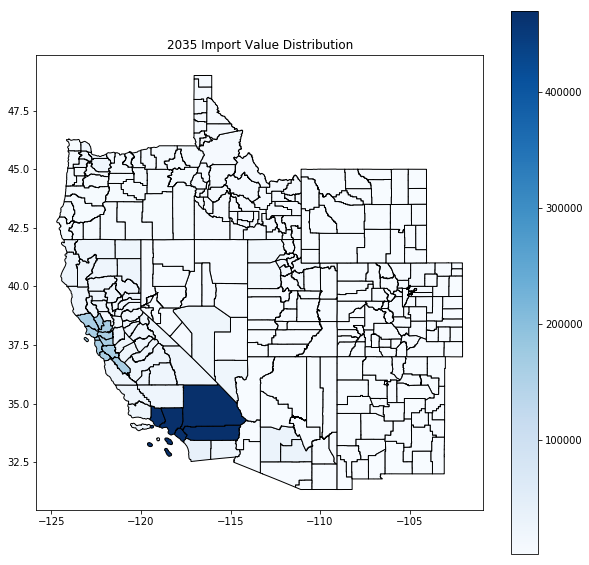

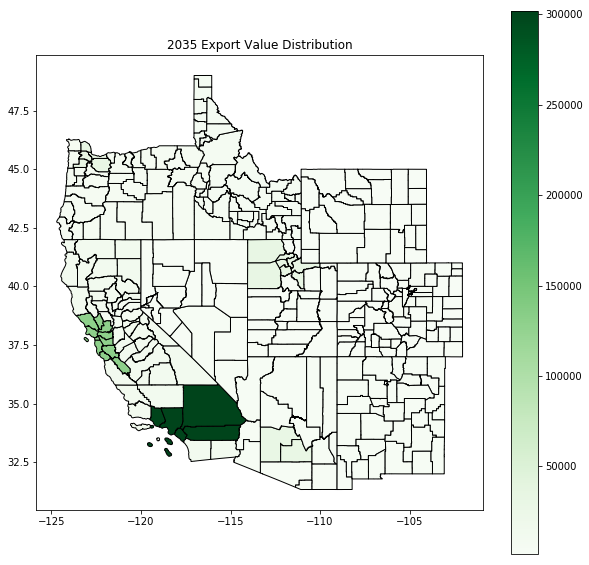

In [75]:
##===========各地区特定年度热力图=============
##进口物流热力图
fig,ax=plt.subplots(figsize=(10,10))
df_import_merge.plot(ax=ax,edgecolor='k',column='value_2035',cmap='Blues',legend=True)
#plt.xlim(-180,-65)
#plt.ylim(20,80)
plt.title('2035 Import Value Distribution')
##出口物流热力图
fig,ax=plt.subplots(figsize=(10,10))
df_export_merge.plot(ax=ax,edgecolor='k',column='value_2035',cmap='Greens',legend=True)
#plt.xlim(-180,-65)
#plt.ylim(20,80)
plt.title('2035 Export Value Distribution')

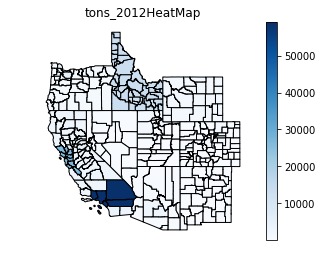

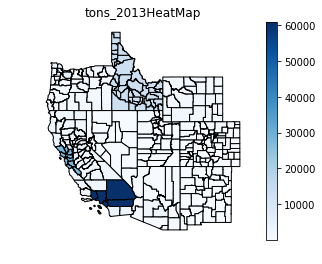

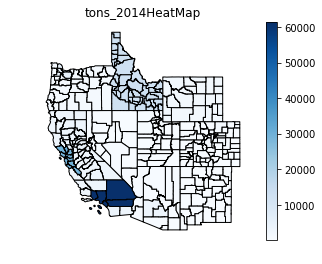

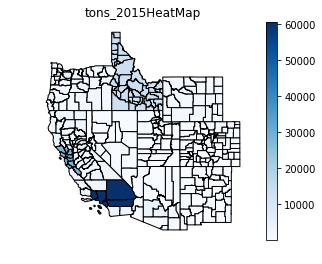

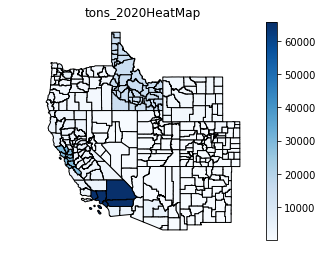

...

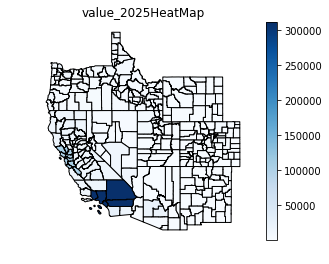

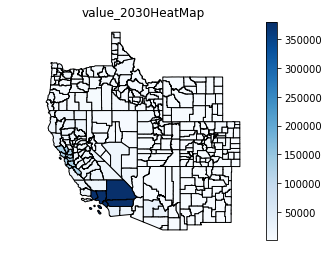

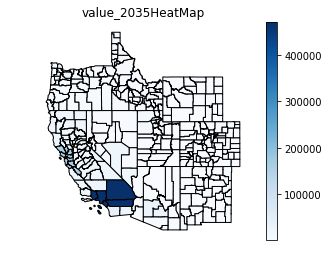

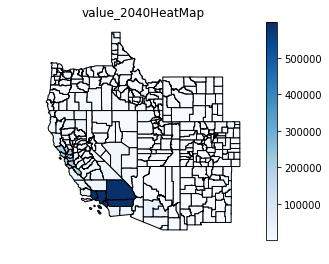

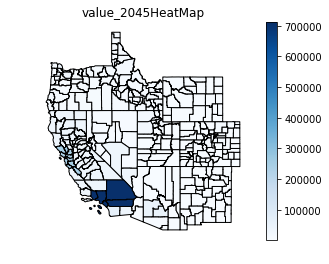

In [14]:
##===========各地区不同年度进口物流量及物流总值热力图=============
for col in df_import_merge.columns[14:34]:
    fig,ax=plt.subplots()
    df_import_merge.plot(ax=ax,edgecolor='k',column=col,cmap='Blues',legend=True)
    plt.title(col+' HeatMap')
    plt.axis('off')

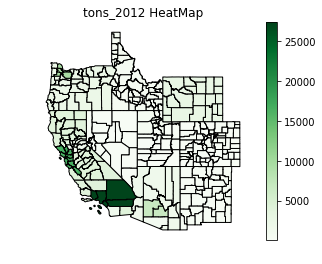

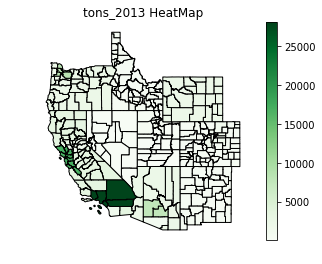

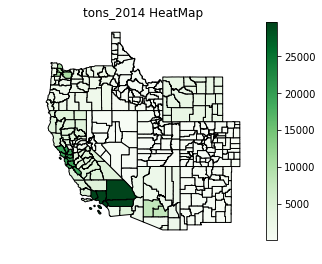

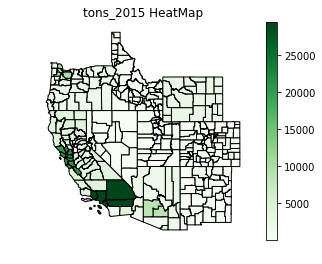

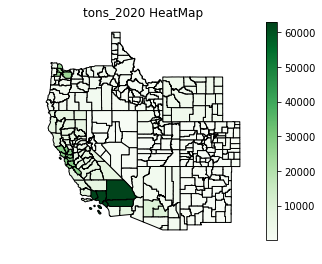

...

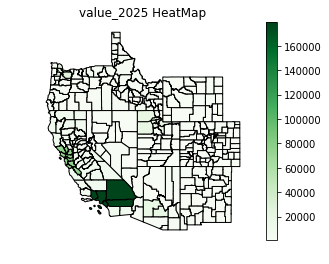

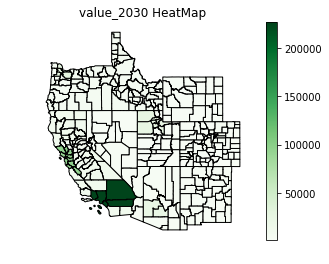

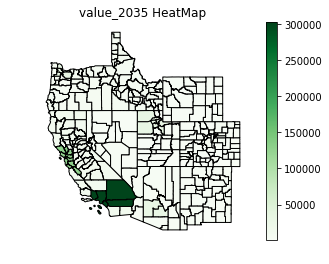

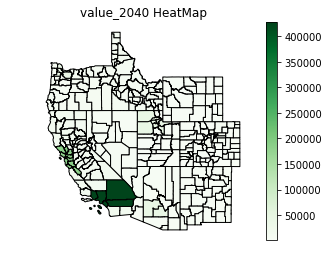

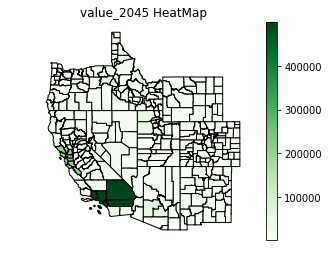

In [15]:
##===========各地区不同年度出口物流量及物流总值热力图=============
for col in df_export_merge.columns[14:34]:
    fig,ax=plt.subplots()
    df_export_merge.plot(ax=ax,edgecolor='k',column=col,cmap='Greens',legend=True)
    plt.title(col+' HeatMap')
    plt.axis('off')

## 绘制各交通方式流量及总值频率分布图




In [16]:
#按照不同交通方式分组
df_mode_group=df.groupby(df['dms_mode'])[df.columns[6:26]].sum()
df_mode_group['dms_mode']=df_mode_group.index
df_mode_group = df_mode_group.reset_index(drop=True)#重设index,并删除原索引

In [18]:
df_mode_group

,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,tons_2045,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_mode
0,1.410449e+06,1.429211e+06,1.463523e+06,1.482164e+06,1.652972e+06,1.783830e+06,1.892784e+06,2.019057e+06,2.159501e+06,2.286636e+06,...,1.605998e+06,1.653559e+06,1.694368e+06,1.939032e+06,2.191077e+06,2.455292e+06,2.786936e+06,3.248654e+06,3.638415e+06,1
1,1.315467e+05,1.296865e+05,1.315751e+05,1.236798e+05,1.223710e+05,1.243290e+05,1.251175e+05,1.281894e+05,1.318484e+05,1.350215e+05,...,2.183453e+04,2.291063e+04,2.297701e+04,2.671358e+04,3.068955e+04,3.333752e+04,3.703266e+04,4.078093e+04,4.612779e+04,2
2,2.176178e+04,2.377522e+04,2.587311e+04,2.465938e+04,2.469391e+04,2.585059e+04,2.691917e+04,2.734687e+04,2.821129e+04,2.918678e+04,...,2.244078e+04,2.422762e+04,2.341343e+04,2.378238e+04,2.546651e+04,2.745294e+04,2.952883e+04,3.293945e+04,3.530454e+04,3
3,3.818240e+02,3.830160e+02,4.092802e+02,4.194513e+02,5.440971e+02,7.031608e+02,8.805130e+02,1.126189e+03,1.520323e+03,1.809394e+03,...,5.621052e+04,5.782136e+04,5.944954e+04,7.829958e+04,1.034637e+05,1.342046e+05,1.772990e+05,2.517631e+05,3.083767e+05,4
4,2.382639e+04,2.393607e+04,2.464176e+04,2.537228e+04,3.105015e+04,3.555235e+04,3.846879e+04,4.200603e+04,4.690919e+04,6.262178e+04,...,1.936927e+05,1.992240e+05,2.058009e+05,2.341459e+05,2.634875e+05,2.947993e+05,3.313948e+05,3.767237e+05,4.258949e+05,5
5,4.012159e+05,4.454939e+05,4.532998e+05,4.694725e+05,5.456311e+05,5.916100e+05,6.358496e+05,6.666160e+05,6.896957e+05,7.106538e+05,...,1.771392e+05,1.835195e+05,1.890160e+05,2.202539e+05,2.390548e+05,2.575835e+05,2.674611e+05,2.733166e+05,2.777214e+05,6
6,2.081443e+04,2.099886e+04,2.090021e+04,1.828665e+04,1.635363e+04,1.542217e+04,1.457820e+04,1.408943e+04,1.355194e+04,1.317399e+04,...,1.754873e+04,8.320884e+03,8.517766e+03,1.077554e+04,1.339239e+04,1.646102e+04,2.044462e+04,2.608368e+04,3.172080e+04,7
7,3.776789e+04,3.877749e+04,3.767379e+04,3.500933e+04,3.317696e+04,3.028217e+04,2.962531e+04,3.231381e+04,3.543194e+04,3.887508e+04,...,2.561371e+04,2.496463e+04,2.320860e+04,2.200969e+04,2.008973e+04,1.965960e+04,2.147480e+04,2.357496e+04,2.589391e+04,8


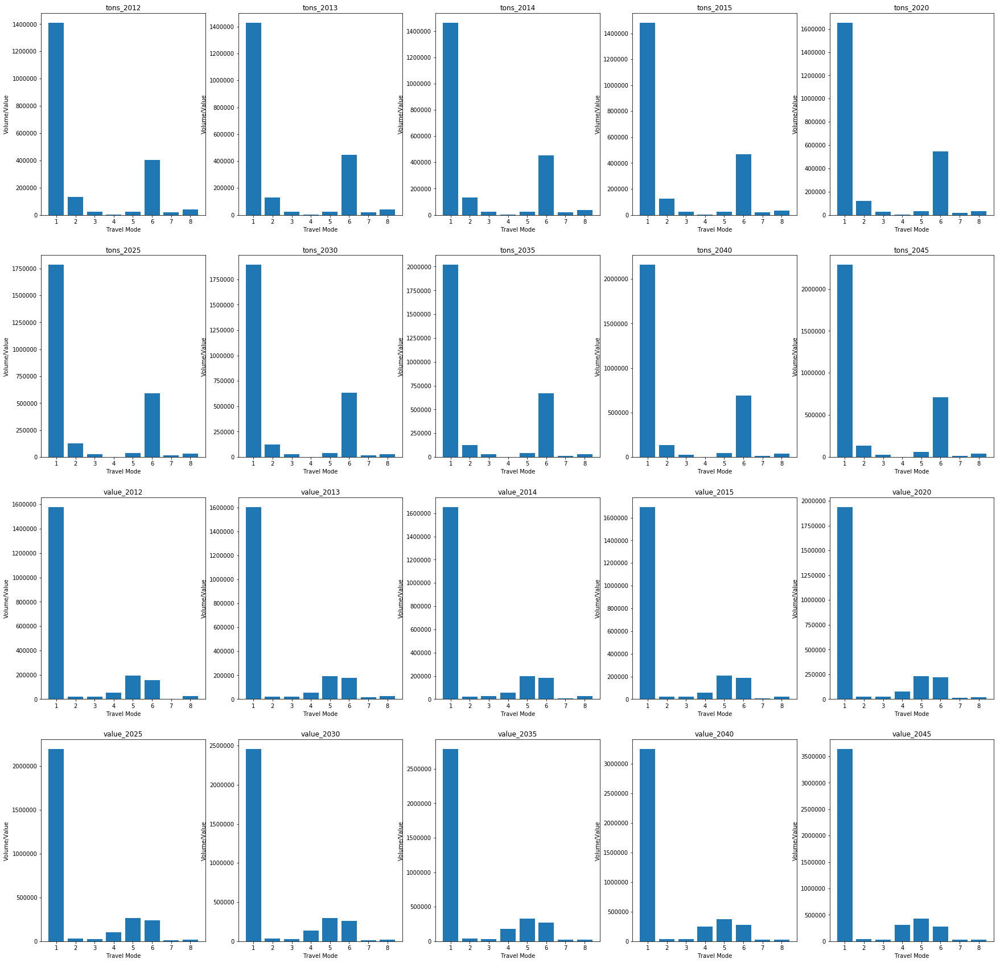

In [68]:
#绘制各方式条形图
num=len(df_mode_group.columns[:-1])
plt.figure(figsize=(30, 30)) 
i=0
for item in df_mode_group.columns[:-1]:
    i=i+1
    plt.subplot(4,5,i)
    plt.bar(df_mode_group['dms_mode'],df_mode_group[item])
    plt.title(item)
    plt.xlabel('Travel Mode')
    plt.ylabel('Volume/Value')        

## 交通方式物流及总值饼图

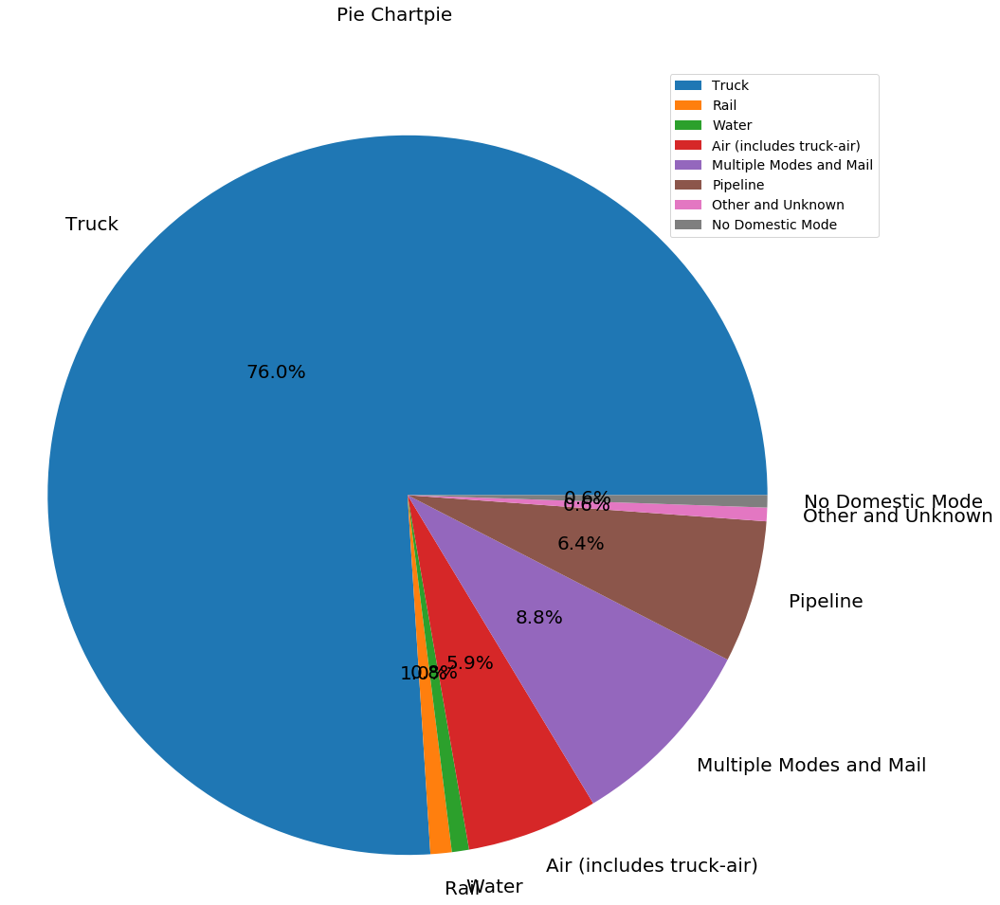

In [40]:
title = 'Pie Chart'
fig = plt.figure(title, figsize=(15, 15))
fig.tight_layout()
ax = fig.add_subplot(111)
data = [3,4,5,7,3]
labels = ['Truck','Rail','Water','Air (includes truck-air)','Multiple Modes and Mail','Pipeline','Other and Unknown','No Domestic Mode']
ax.pie(df_mode_group['value_2040'], labels= labels, radius=0.8, #data 是数据，labels 是标签，radius 是饼图半径
       explode =None,#explodes 为0 代表不偏离圆心， 不为零则代表偏离圆心的距离
       autopct='%1.1f%%', #显示所占比例，百分数
       pctdistance = 0.5,
       labeldistance=1.1,  # a,b,c,d 到圆心的距离
       textprops={'fontsize': 20, 'color': 'black'}) # 标签和比例的格式
plt.axis('equal') # 正圆
plt.legend( loc = 'upper right',bbox_to_anchor=(1.1, 1.05), fontsize=14, borderaxespad=0.3)
plt.suptitle(title+'pie', fontsize=20)
plt.show()
# plt.close()


## 区域货物流量排名

In [81]:
df=pd.read_csv('orders_regions.csv')#读取表格数据
df.head()

,fr_orig,dms_orig,dms_dest,fr_dest,dms_mode,trade_type,tons_2012,tons_2013,tons_2014,tons_2015,...,value_2012,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045
0,NaN,41,41,NaN,1,1,9.4271,8.0744,8.5333,8.7350,...,26.3959,22.6083,23.8934,24.4580,24.5794,24.1671,23.9867,23.4553,23.0211,23.7070
1,NaN,41,42,NaN,1,1,10.8730,9.4939,10.0537,10.2454,...,30.4444,26.5829,28.1502,28.6871,31.4683,33.6674,37.2330,39.2266,41.9147,45.5499
2,NaN,41,61,NaN,1,1,117.3168,106.7540,113.0699,107.2314,...,351.0104,319.4067,338.3039,320.8349,362.6319,399.1541,426.9936,451.3735,474.0091,509.4556
3,NaN,41,69,NaN,1,1,47.9217,41.9075,42.7999,38.5380,...,98.5453,86.1778,88.0130,79.2487,78.9657,78.6754,77.6467,78.1334,78.7642,81.9460
4,NaN,42,41,NaN,1,1,4.5427,4.0461,4.4045,4.5846,...,12.7196,11.3291,12.3327,12.8370,13.4729,13.7776,13.8346,13.8059,13.6660,14.2980


In [82]:
df_rank= df.drop(['fr_orig','fr_dest'], axis = 1) #删除不相关列
df_rank.head()

,dms_orig,dms_dest,dms_mode,trade_type,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,...,value_2012,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045
0,41,41,1,1,9.4271,8.0744,8.5333,8.7350,8.7784,8.6311,...,26.3959,22.6083,23.8934,24.4580,24.5794,24.1671,23.9867,23.4553,23.0211,23.7070
1,41,42,1,1,10.8730,9.4939,10.0537,10.2454,11.2387,12.0241,...,30.4444,26.5829,28.1502,28.6871,31.4683,33.6674,37.2330,39.2266,41.9147,45.5499
2,41,61,1,1,117.3168,106.7540,113.0699,107.2314,121.2010,133.4077,...,351.0104,319.4067,338.3039,320.8349,362.6319,399.1541,426.9936,451.3735,474.0091,509.4556
3,41,69,1,1,47.9217,41.9075,42.7999,38.5380,38.4003,38.2591,...,98.5453,86.1778,88.0130,79.2487,78.9657,78.6754,77.6467,78.1334,78.7642,81.9460
4,42,41,1,1,4.5427,4.0461,4.4045,4.5846,4.8117,4.9205,...,12.7196,11.3291,12.3327,12.8370,13.4729,13.7776,13.8346,13.8059,13.6660,14.2980


In [94]:
#按起点数据分组
df_rank_orig=df_rank.groupby(df_rank['dms_orig'])[df_rank.columns[4:24]].sum()
df_rank_orig['dms_orig']=df_rank_orig.index #将index添加到dataframe数据
df_rank_orig = df_rank_orig.reset_index(drop=True)#重设index,并删除原索引
df_rank_orig['dms_orig']= df_rank_orig['dms_orig'].apply(lambda x:str(x).zfill(3)) # 不足三位前面补0，为与后面.shp文件保持一致
df_rank_orig

,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,tons_2045,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_orig
0,88109.876867,85303.041057,88087.385485,90185.708985,98803.053061,102196.810406,107640.031053,112506.031825,119190.052566,127949.743033,...,93210.140494,96086.214801,98308.154205,1.109489e+05,1.244309e+05,1.393220e+05,1.574513e+05,1.825772e+05,2.146081e+05,041
1,27330.423789,28787.293590,28000.335545,30026.932810,32031.907746,36071.170904,38445.097500,43152.071187,49598.723145,52999.797064,...,21218.248941,22388.763229,23272.442415,2.708970e+04,3.173053e+04,3.701780e+04,4.366605e+04,5.298201e+04,6.158976e+04,042
2,49262.385822,52228.065764,53215.296796,53661.040775,61676.370123,66576.420096,70371.263570,73893.972456,76752.306196,83509.453692,...,20758.876908,21198.340604,21482.016762,2.484249e+04,2.755984e+04,3.016279e+04,3.297580e+04,3.628261e+04,4.029917e+04,049
3,463607.750497,473841.683860,489352.952016,499858.855675,585290.630912,661886.426356,717770.425417,784744.602706,857134.939848,934254.069449,...,889898.551358,910038.426310,939345.676731,1.103219e+06,1.278607e+06,1.462924e+06,1.698518e+06,2.025049e+06,2.289404e+06,061
4,54114.540432,54436.306545,55461.587137,56477.088793,64418.242143,69944.194992,72129.482010,74648.820819,77293.624247,82370.433044,...,59734.914545,60058.974023,60480.276494,6.678431e+04,7.242173e+04,7.718918e+04,8.283835e+04,8.877098e+04,9.771334e+04,062
5,41784.871020,42104.626663,43324.838945,44036.445240,47513.456245,50832.441268,54361.738316,59185.697093,65151.373273,71475.314441,...,77301.422361,81537.857307,84657.083742,9.883061e+04,1.133878e+05,1.300280e+05,1.510324e+05,1.794568e+05,2.043233e+05,063
6,230035.630189,240059.767854,250164.582993,249211.510393,270403.420690,288624.187636,303591.131190,323067.557822,346477.656721,353110.461342,...,314623.566682,325574.898202,333305.481340,3.785896e+05,4.311145e+05,4.908353e+05,5.683939e+05,6.838178e+05,7.652308e+05,064
7,179277.801604,185398.065714,190815.715655,190680.663718,208946.307094,220908.193894,229061.465093,237837.025026,248207.701284,261488.935875,...,117800.581658,121431.182417,119366.067782,1.322823e+05,1.441718e+05,1.536515e+05,1.638288e+05,1.767001e+05,1.917022e+05,069
8,117156.227435,128395.453171,130027.712278,132883.839058,150173.938277,161377.256716,176781.515786,192776.491400,199458.309686,204938.812622,...,93293.291493,96242.433238,99052.416926,1.088466e+05,1.170417e+05,1.257807e+05,1.348390e+05,1.455025e+05,1.564428e+05,081
9,124777.296340,133731.808842,137464.288013,136497.186466,142974.613628,147256.740688,147470.275333,147643.880911,148243.943912,150460.228736,...,44660.480631,46087.786606,46604.341323,5.045297e+04,5.323195e+04,5.515871e+04,5.694945e+04,5.913910e+04,6.260306e+04,089


In [95]:
#按终点数据分组
df_rank_dest=df_rank.groupby(df_rank['dms_dest'])[df_rank.columns[4:24]].sum()
df_rank_dest['dms_dest']=df_rank_dest.index #将index添加到dataframe数据
df_rank_dest = df_rank_dest.reset_index(drop=True)#重设index,并删除原索引
df_rank_dest['dms_dest']= df_rank_dest['dms_dest'].apply(lambda x:str(x).zfill(3)) # 不足三位前面补0，为与后面.shp文件保持一致
df_rank_dest

,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,tons_2045,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_dest
0,106211.492306,104336.919857,106480.717360,109444.280897,121386.039123,126803.539191,134369.984743,141563.221902,149703.617450,158793.775250,...,108325.788940,111727.848008,115331.518093,129836.825941,1.438052e+05,1.589704e+05,1.758387e+05,1.965539e+05,2.186149e+05,041
1,35466.907689,38920.385458,38001.658211,40572.310025,44040.115355,48683.599126,50968.755728,55051.695634,60711.628164,63967.087208,...,25303.381307,26431.118291,27495.614504,31730.407107,3.609601e+04,4.058940e+04,4.583700e+04,5.308711e+04,6.054947e+04,042
2,39841.177734,39520.206160,39275.467151,39303.522187,40761.762830,41649.464304,42620.165670,43850.818769,45821.365788,49041.002056,...,25990.363273,26518.827739,27149.377512,29759.345863,3.236877e+04,3.512785e+04,3.808785e+04,4.169286e+04,4.587363e+04,049
3,479633.602546,493849.187881,512156.256126,520141.720321,606069.105623,685028.303359,745288.241374,813683.918585,889232.318109,957244.748499,...,771259.746329,802978.298677,826693.275094,972686.490437,1.133994e+06,1.304823e+06,1.523122e+06,1.830315e+06,2.065314e+06,061
4,59711.580745,59077.103396,60181.406263,60699.040868,69067.085906,75724.581025,78611.947709,82237.528797,85750.249795,90745.479646,...,57894.503810,58827.004355,59893.316752,67233.850654,7.409229e+04,7.938208e+04,8.630971e+04,9.387845e+04,1.029721e+05,062
5,52781.922523,55304.930807,56963.466742,57510.514990,63807.496217,69289.268977,73257.001858,78410.816538,84153.107314,91005.585109,...,97276.049482,101083.643158,103330.819456,118607.918297,1.342862e+05,1.499963e+05,1.694002e+05,1.948317e+05,2.211948e+05,063
6,223560.528507,232472.500071,241509.980587,239441.497004,265461.862544,286869.381060,301969.120949,322500.506263,346931.034430,368554.581034,...,318109.526620,322378.479377,326900.220073,377968.779236,4.365016e+05,5.003168e+05,5.862873e+05,7.196528e+05,8.295300e+05,064
7,193018.311563,199739.253177,206473.223837,213407.978434,235827.045595,249775.168792,257731.589057,267344.123280,277418.169701,291593.996648,...,140725.817167,144863.050037,148667.798381,165206.276172,1.796609e+05,1.915551e+05,2.059194e+05,2.229173e+05,2.423817e+05,069
8,113421.834061,118728.349977,120014.612382,119480.571279,131249.238763,138058.812266,148544.988009,158884.185183,160178.358061,161666.087721,...,80027.785586,82472.827732,83809.068386,92618.995726,9.993698e+04,1.079011e+05,1.161950e+05,1.260844e+05,1.366908e+05,081
9,128479.659777,131094.561831,134682.982800,133329.670515,137949.893352,141287.258887,143240.939763,145407.818618,147618.505303,151467.626928,...,58120.490510,59337.941747,60063.522834,64157.729635,6.692188e+04,7.003216e+04,7.294841e+04,7.637709e+04,8.064510e+04,089


In [147]:
df_rank_sum= df_rank_dest.set_index('dms_dest').add(df_rank_orig.set_index('dms_orig'), fill_value=0).reset_index() #两个dataframe对应位置求和
df_rank_sum=df_rank_sum.rename(columns={'dms_dest':'regcode'}) #区域代码列重命名
df_rank_sum

,regcode,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,...,value_2012,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045
0,041,194321.369173,189639.960914,1.945681e+05,1.996300e+05,2.201891e+05,2.290003e+05,2.420100e+05,2.540693e+05,2.688937e+05,...,2.012383e+05,2.015359e+05,2.078141e+05,2.136397e+05,2.407857e+05,2.682361e+05,2.982924e+05,3.332900e+05,3.791311e+05,4.332230e+05
1,042,62797.331477,67707.679047,6.600199e+04,7.059924e+04,7.607202e+04,8.475477e+04,8.941385e+04,9.820377e+04,1.103104e+05,...,4.618975e+04,4.652163e+04,4.881988e+04,5.076806e+04,5.882010e+04,6.782654e+04,7.760720e+04,8.950305e+04,1.060691e+05,1.221392e+05
2,049,89103.563556,91748.271924,9.249076e+04,9.296456e+04,1.024381e+05,1.082259e+05,1.129914e+05,1.177448e+05,1.225737e+05,...,4.483816e+04,4.674924e+04,4.771717e+04,4.863139e+04,5.460184e+04,5.992862e+04,6.529063e+04,7.106365e+04,7.797546e+04,8.617279e+04
3,061,943241.353043,967690.871741,1.001509e+06,1.020001e+06,1.191360e+06,1.346915e+06,1.463059e+06,1.598429e+06,1.746367e+06,...,1.594611e+06,1.661158e+06,1.713017e+06,1.766039e+06,2.075905e+06,2.412602e+06,2.767747e+06,3.221640e+06,3.855364e+06,4.354718e+06
4,062,113826.121177,113513.409941,1.156430e+05,1.171761e+05,1.334853e+05,1.456688e+05,1.507414e+05,1.568863e+05,1.630439e+05,...,1.192822e+05,1.176294e+05,1.188860e+05,1.203736e+05,1.340182e+05,1.465140e+05,1.565713e+05,1.691481e+05,1.826494e+05,2.006855e+05
5,063,94566.793543,97409.557470,1.002883e+05,1.015470e+05,1.113210e+05,1.201217e+05,1.276187e+05,1.375965e+05,1.493045e+05,...,1.730816e+05,1.745775e+05,1.826215e+05,1.879879e+05,2.174385e+05,2.476740e+05,2.800243e+05,3.204326e+05,3.742885e+05,4.255182e+05
6,064,453596.158695,472532.267925,4.916746e+05,4.886530e+05,5.358653e+05,5.754936e+05,6.055603e+05,6.455681e+05,6.934087e+05,...,6.125090e+05,6.327331e+05,6.479534e+05,6.602057e+05,7.565584e+05,8.676161e+05,9.911521e+05,1.154681e+06,1.403471e+06,1.594761e+06
7,069,372296.113167,385137.318892,3.972889e+05,4.040886e+05,4.447734e+05,4.706834e+05,4.867931e+05,5.051811e+05,5.256259e+05,...,2.512983e+05,2.585264e+05,2.662942e+05,2.680339e+05,2.974885e+05,3.238327e+05,3.452066e+05,3.697483e+05,3.996174e+05,4.340839e+05
8,081,230578.061496,247123.803148,2.500423e+05,2.523644e+05,2.814232e+05,2.994361e+05,3.253265e+05,3.516607e+05,3.596367e+05,...,1.680682e+05,1.733211e+05,1.787153e+05,1.828615e+05,2.014656e+05,2.169787e+05,2.336818e+05,2.510339e+05,2.715869e+05,2.931336e+05
9,089,253256.956117,264826.370673,2.721473e+05,2.698269e+05,2.809245e+05,2.885440e+05,2.907112e+05,2.930517e+05,2.958624e+05,...,9.775524e+04,1.027810e+05,1.054257e+05,1.066679e+05,1.146107e+05,1.201538e+05,1.251909e+05,1.298979e+05,1.355162e+05,1.432482e+05


In [146]:
#按列排序并输出前五/后五区域
for col in df_rank_sum.columns[1:]:
    df_rank_sum.sort_values(by=col , inplace=True, ascending=True) 
    print('Top 5 regions sorted by ' +col+' are:\n',df_rank_sum['regcode'][0:5])
    print('Bottom 5 regions sorted by'+col+' are:\n',df_rank_sum['regcode'][-5:])

Top 5 regions sorted by tons_2012 are:
 1     042
12    329
17    499
11    321
2     049
Name: regcode, dtype: object
Bottom 5 regions sorted bytons_2012 are:
 9     089
18    560
7     069
6     064
3     061
Name: regcode, dtype: object
Top 5 regions sorted by tons_2013 are:
 1     042
12    329
11    321
17    499
2     049
Name: regcode, dtype: object
Bottom 5 regions sorted bytons_2013 are:
 9     089
18    560
7     069
6     064
3     061
Name: regcode, dtype: object
Top 5 regions sorted by tons_2014 are:
 1     042
12    329
11    321
17    499
2     049
Name: regcode, dtype: object
Bottom 5 regions sorted bytons_2014 are:
 9     089
18    560
7     069
6     064
3     061
Name: regcode, dtype: object
Top 5 regions sorted by tons_2015 are:
 12    329
1     042
17    499
2     049
11    321
Name: regcode, dtype: object
Bottom 5 regions sorted bytons_2015 are:
 18    560
9     089
7     069
6     064
3     061
Name: regcode, dtype: object
Top 5 regions sorted by tons_2020 are:
 

# Task 1.2

In [155]:
df=pd.read_csv('orders_regions.csv')#读取表格数据

#物流目标区域数据处理
df_dms_data_group=df.groupby(df['dms_dest'])[df.columns[6:26]].sum() #进口数据按地区分组，并求和
df_dms_data_group['dms_dest']=df_dms_data_group.index #将index添加到dataframe数据
df_dms_data_group = df_dms_data_group.reset_index(drop=True)#重设index,并删除原索引
df_dms_data_group['dms_dest']= df_dms_data_group['dms_dest'].apply(lambda x:str(x).zfill(3)) #dms_dest 不足三位前面补0，为与后面.shp文件保持一致

df_dms_data_group

,tons_2012,tons_2013,tons_2014,tons_2015,tons_2020,tons_2025,tons_2030,tons_2035,tons_2040,tons_2045,...,value_2013,value_2014,value_2015,value_2020,value_2025,value_2030,value_2035,value_2040,value_2045,dms_dest
0,106211.492306,104336.919857,106480.717360,109444.280897,121386.039123,126803.539191,134369.984743,141563.221902,149703.617450,158793.775250,...,108325.788940,111727.848008,115331.518093,129836.825941,1.438052e+05,1.589704e+05,1.758387e+05,1.965539e+05,2.186149e+05,041
1,35466.907689,38920.385458,38001.658211,40572.310025,44040.115355,48683.599126,50968.755728,55051.695634,60711.628164,63967.087208,...,25303.381307,26431.118291,27495.614504,31730.407107,3.609601e+04,4.058940e+04,4.583700e+04,5.308711e+04,6.054947e+04,042
2,39841.177734,39520.206160,39275.467151,39303.522187,40761.762830,41649.464304,42620.165670,43850.818769,45821.365788,49041.002056,...,25990.363273,26518.827739,27149.377512,29759.345863,3.236877e+04,3.512785e+04,3.808785e+04,4.169286e+04,4.587363e+04,049
3,479633.602546,493849.187881,512156.256126,520141.720321,606069.105623,685028.303359,745288.241374,813683.918585,889232.318109,957244.748499,...,771259.746329,802978.298677,826693.275094,972686.490437,1.133994e+06,1.304823e+06,1.523122e+06,1.830315e+06,2.065314e+06,061
4,59711.580745,59077.103396,60181.406263,60699.040868,69067.085906,75724.581025,78611.947709,82237.528797,85750.249795,90745.479646,...,57894.503810,58827.004355,59893.316752,67233.850654,7.409229e+04,7.938208e+04,8.630971e+04,9.387845e+04,1.029721e+05,062
5,52781.922523,55304.930807,56963.466742,57510.514990,63807.496217,69289.268977,73257.001858,78410.816538,84153.107314,91005.585109,...,97276.049482,101083.643158,103330.819456,118607.918297,1.342862e+05,1.499963e+05,1.694002e+05,1.948317e+05,2.211948e+05,063
6,223560.528507,232472.500071,241509.980587,239441.497004,265461.862544,286869.381060,301969.120949,322500.506263,346931.034430,368554.581034,...,318109.526620,322378.479377,326900.220073,377968.779236,4.365016e+05,5.003168e+05,5.862873e+05,7.196528e+05,8.295300e+05,064
7,193018.311563,199739.253177,206473.223837,213407.978434,235827.045595,249775.168792,257731.589057,267344.123280,277418.169701,291593.996648,...,140725.817167,144863.050037,148667.798381,165206.276172,1.796609e+05,1.915551e+05,2.059194e+05,2.229173e+05,2.423817e+05,069
8,113421.834061,118728.349977,120014.612382,119480.571279,131249.238763,138058.812266,148544.988009,158884.185183,160178.358061,161666.087721,...,80027.785586,82472.827732,83809.068386,92618.995726,9.993698e+04,1.079011e+05,1.161950e+05,1.260844e+05,1.366908e+05,081
9,128479.659777,131094.561831,134682.982800,133329.670515,137949.893352,141287.258887,143240.939763,145407.818618,147618.505303,151467.626928,...,58120.490510,59337.941747,60063.522834,64157.729635,6.692188e+04,7.003216e+04,7.294841e+04,7.637709e+04,8.064510e+04,089


In [156]:
df_area=gpd.read_file(r'./CFS_AREA_shapefile_010215/CFS_AREA_shapefile_010215.shp')#读取地理信息数据
df_area.crs #查看当前shp文件坐标系
df_area.head()

,ANSI_ST,ANSI_CNTY,ANSI_ST_CO,CNTY_NAME,CFS07_AREA,CFS12_AREA,CFS07_TYPE,CFS12_TYPE,CFS07DDGEO,CFS07GEOID,CFS12GEOID,CFS07_NAME,CFS12_NAME,geometry
0,15,001,15001,Hawaii County,99999,99999,R,R,159,E330000US1599999999,E330000US1599999999,Remainder of Hawaii,Remainder of Hawaii,"POLYGON ((-155.96346 19.08207, -155.96649 19.0..."
1,05,027,05027,Columbia County,99999,99999,R,R,050,E330000US0599999999,E330000US0599999999,Remainder of Arkansas,Remainder of Arkansas,"POLYGON ((-93.49052 33.01846, -93.49052 33.018..."
2,38,011,38011,Bowman County,99999,99999,R,R,380,E330000US3899999999,E330000US3899999999,Remainder of North Dakota,Remainder of North Dakota,"POLYGON ((-104.04579 46.11943, -104.04579 46.1..."
3,36,031,36031,Essex County,99999,99999,R,R,369,E330000US3699999999,E330000US3699999999,Remainder of New York,Remainder of New York,"POLYGON ((-73.90969 44.42970, -73.89728 44.430..."
4,35,007,35007,Colfax County,99999,99999,R,R,350,E330000US3599999999,E330000US3599999999,Remainder of New Mexico,Remainder of New Mexico,"POLYGON ((-104.88900 36.26114, -104.90147 36.2..."


In [181]:
type(df_area)

geopandas.geodataframe.GeoDataFrame

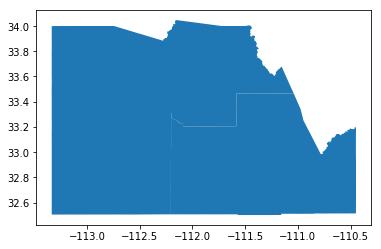

In [165]:

df_tar_041.plot()

In [209]:
df_tar_area=[]
for area in df_dms_data_group['dms_dest']:
    tar_area=df_area[(df_area['CFS07DDGEO']==area)]
    uni_tar_area = shapely.ops.unary_union(tar_area['geometry']) ##区域合并
    df_tar_area.append(uni_tar_area)
df_tar_area=pd.DataFrame(({'area':df_dms_data_group['dms_dest'], 'geometry':df_tar_area})).reset_index(drop = True) ##合并之后区域转换为dataframe数据
gdf_tar_area = gpd.GeoDataFrame(df_tar_area, geometry='geometry',crs=df_area.crs)  

D:\anzhuan\Anaconda\lib\site-packages\pandas\core\dtypes\cast.py:1591: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


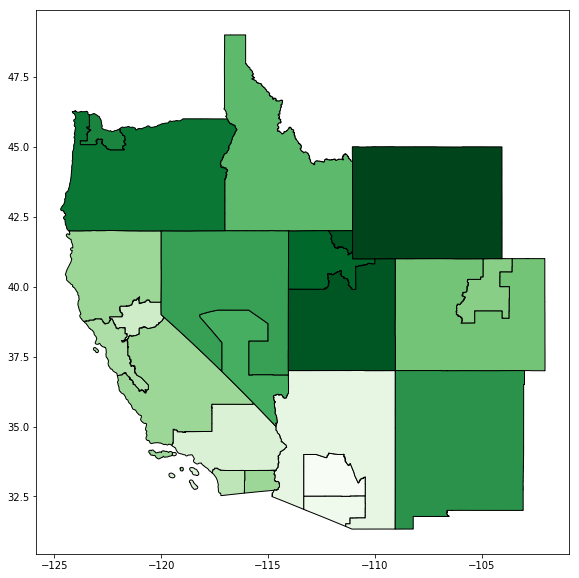

In [210]:
fig,ax=plt.subplots(figsize=(10,10))
gdf_tar_area.plot(ax=ax,edgecolor='k',cmap='Greens')

In [213]:
gdf_tar_area['geometry']

0     POLYGON ((-111.03187 33.45076, -111.01898 33.4...
1     POLYGON ((-112.57476 32.50522, -112.57379 32.5...
2     POLYGON ((-111.36656 31.43194, -111.36657 31.4...
3     MULTIPOLYGON (((-118.67855 33.02636, -118.6782...
4     POLYGON ((-120.00245 39.06680, -120.00240 39.0...
5     POLYGON ((-117.32094 32.68985, -117.32180 32.6...
6     MULTIPOLYGON (((-122.58482 37.59703, -122.5839...
7     MULTIPOLYGON (((-122.03526 36.55746, -122.0374...
8     POLYGON ((-105.96720 38.69750, -105.96537 38.6...
9     POLYGON ((-107.25622 37.00000, -107.25874 37.0...
10    POLYGON ((-115.72456 41.99692, -115.72859 41.9...
11    POLYGON ((-115.89159 36.84206, -115.89038 36.8...
12    POLYGON ((-118.81602 38.17380, -118.83534 38.1...
13    POLYGON ((-109.04855 31.95929, -109.04854 31.9...
14    POLYGON ((-122.78823 45.13026, -122.78815 45.1...
15    POLYGON ((-122.32037 42.00842, -122.32374 42.0...
16    POLYGON ((-110.90210 40.66796, -110.90213 40.6...
17    MULTIPOLYGON (((-111.41344 37.00151, -111.

## 生成区域质心
生成的是研究的19个区域的质心，而非全部地区的质心

In [214]:
##
gdf_tar_area['poly_centroid'] = gdf_tar_area.to_crs('+proj=cea').centroid.to_crs(gdf_tar_area.crs) #生成各区域质心并新增至dataframe
##注意一定要用等面积投影：to_crs('+proj=cea')，
#df_area['centroid_column'] = df_area.geometry.centroid  ##报错：UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation
gdf_tar_area

,area,geometry,poly_centroid
0,041,"POLYGON ((-111.03187 33.45076, -111.01898 33.4...",POINT (-112.06968 33.18273)
1,042,"POLYGON ((-112.57476 32.50522, -112.57379 32.5...",POINT (-111.78962 32.09636)
2,049,"POLYGON ((-111.36656 31.43194, -111.36657 31.4...",POINT (-111.58352 34.64827)
3,061,"MULTIPOLYGON (((-118.67855 33.02636, -118.6782...",POINT (-116.64722 34.46180)
4,062,"POLYGON ((-120.00245 39.06680, -120.00240 39.0...",POINT (-121.05540 38.90869)
5,063,"POLYGON ((-117.32094 32.68985, -117.32180 32.6...",POINT (-116.77007 33.02714)
6,064,"MULTIPOLYGON (((-122.58482 37.59703, -122.5839...",POINT (-122.10765 37.72781)
7,069,"MULTIPOLYGON (((-122.03526 36.55746, -122.0374...",POINT (-120.35319 37.96494)
8,081,"POLYGON ((-105.96720 38.69750, -105.96537 38.6...",POINT (-104.76808 39.80912)
9,089,"POLYGON ((-107.25622 37.00000, -107.25874 37.0...",POINT (-105.66061 38.85017)


In [215]:
gdf_tar_area.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

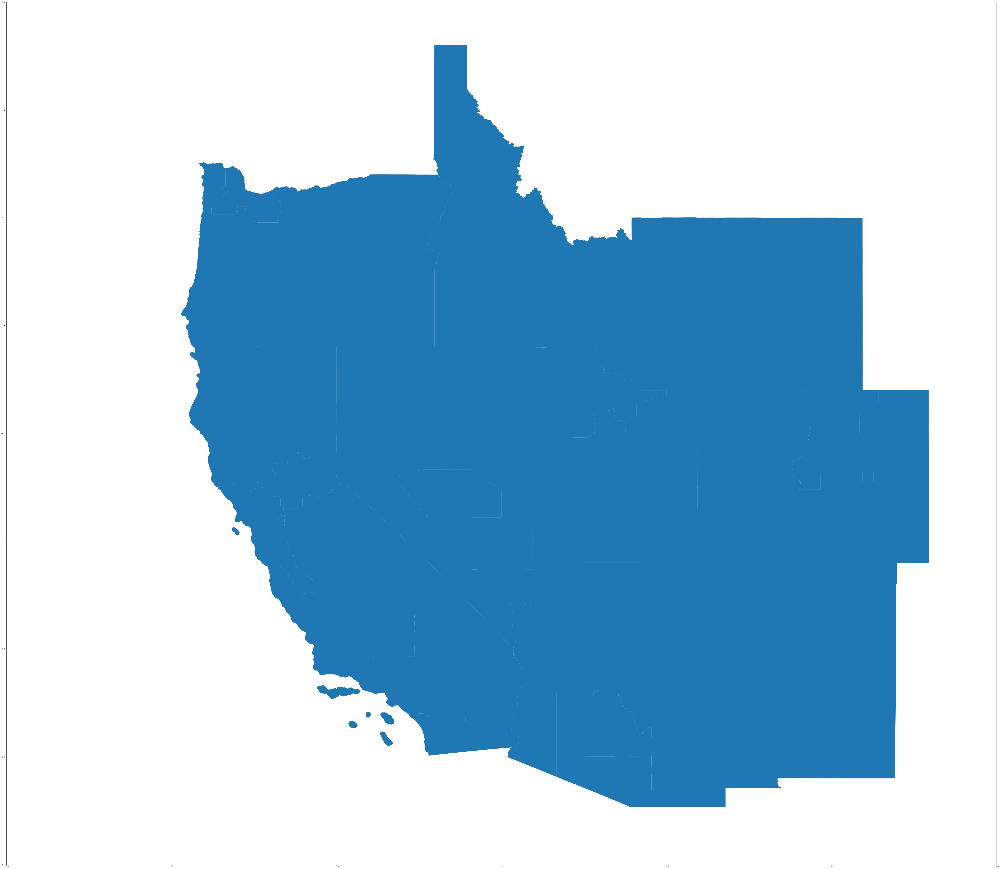

In [217]:
#绘制不含质心区域地图
gdf_tar_area.plot(figsize=(100,100))
plt.xlim(-130,-100)
plt.ylim(30,50)
plt.show()

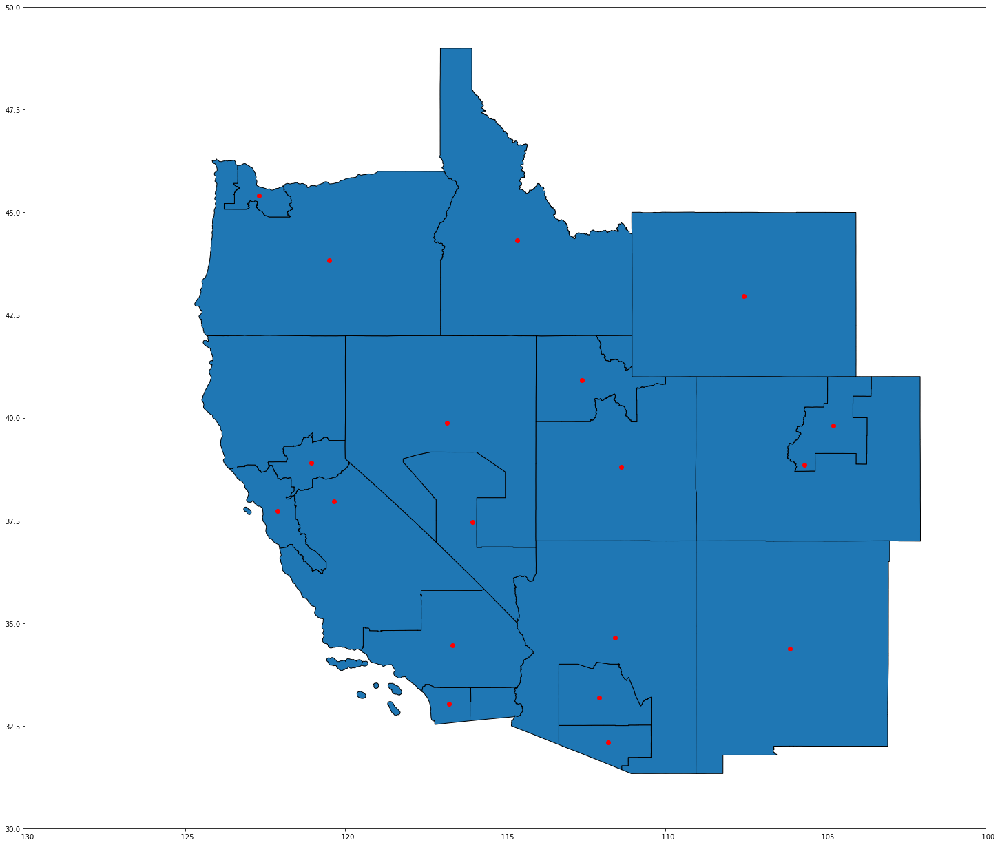

In [218]:
#绘制含质心区域地图
ax=gdf_tar_area.plot(edgecolor='black',figsize=(25,25))
gdf_tar_area['poly_centroid'].plot(ax=ax,color='red')
plt.xlim(-130,-100)
plt.ylim(30,50)
plt.show()

## K-Means 聚类

In [219]:
#提取质心坐标，并转换为数组
Coords=[] #放入点坐标列表
num_points=len(gdf_tar_area['poly_centroid'])
for i in range(num_points):
    point_coord=gdf_tar_area['poly_centroid'][i].coords[:] #提取point 坐标
    point_coord=list(point_coord[0])# 转换为列表
    Coords.append(point_coord) #放入点坐标列表
    
np.array(Coords).shape #查看采集质心坐标数量是否全

(19, 2)

In [220]:
Coords

[[-112.0696837958608, 33.18272994314951],
 [-111.78962096538912, 32.096357465162484],
 [-111.58351994218042, 34.64827453488435],
 [-116.64721855694852, 34.46180055209457],
 [-121.05540150193113, 38.90868620340172],
 [-116.77006548224567, 33.02713514028706],
 [-122.10764859801907, 37.72780532892624],
 [-120.35319136888566, 37.96494268894757],
 [-104.76807768305943, 39.80911888728383],
 [-105.6606100371474, 38.850172654656724],
 [-114.63593005117312, 44.314542264606956],
 [-116.02363234708697, 37.46735859590997],
 [-116.8367257842114, 39.87910848829974],
 [-106.11041926343971, 34.381993595588646],
 [-122.69078028357784, 45.40780889138681],
 [-120.50869368658678, 43.83754894491022],
 [-112.61809085111285, 40.915580753696965],
 [-111.38684991106953, 38.79488996566123],
 [-107.55142154601762, 42.96755180826565]]

In [ ]:
##或通过以下方式获取点坐标
xs = [point.x for point in df_area['poly_centroid']]
ys = [point.y for point in df_area['poly_centroid']]

In [221]:
##构建并训练Kmeans 模型
#假设：这里距离是默认按照欧氏距离
#假设：中心数8
from sklearn.cluster import KMeans
n_clusters=8
Kmeans_model=KMeans(n_clusters=n_clusters,random_state=0)
model=Kmeans_model.fit(Coords)
labels = model.labels_

##model=Kmeans_model.fit(Coords) 报错
#np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
#Deprecated in NumPy 1.20; for more details and guidance
##解决方法：1.升级scikit-learn： pip install scikit-learn --upgrade --user 2.用np.float64代替float  3.用 dtype=float 参考https://stackoverflow.com/questions/69998557/how-to-get-rid-of-deprecating-warning-np-float-is-a-deprecated-alias-for-buil

D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: Depr

In [222]:
print('k labels are:',model.labels_)#显示类别标签
print('cluster centers are:',model.cluster_centers_)# 输出类簇中心
#print('predict results are:',model.predict([x,x]))#显示预测结果

k labels are: [3 3 3 7 4 7 4 4 0 0 6 1 1 5 2 2 6 6 0]
cluster centers are: [[-105.99336976   40.54228112]
 [-116.43017907   38.67323354]
 [-121.59973699   44.62267892]
 [-111.8142749    33.30912065]
 [-121.17208049   38.20047807]
 [-106.11041926   34.3819936 ]
 [-112.88029027   41.34167099]
 [-116.70864202   33.74446785]]


## 画拐点图

In [223]:
SSE = []  # #簇内误差平方和  SSE
for k in range(2,13):
    Kmeans_model = KMeans(n_clusters=k)  # 构造聚类器
    Kmeans_model.fit(Coords)
    SSE.append(Kmeans_model.inertia_) # estimator.inertia_获取聚类准则的总和

D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: Depr

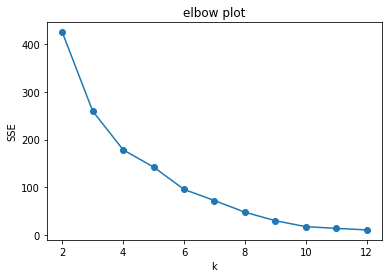

In [224]:
plt.title('elbow plot')
plt.xlabel('k')
plt.ylabel('SSE')
plt.plot(range(2,13),SSE,'o-')
plt.show()

## 轮廓系数法

D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: Depr

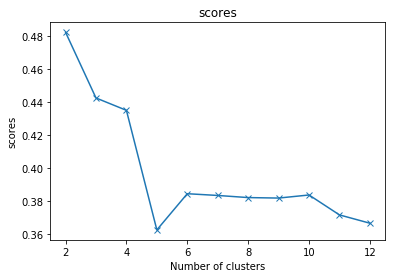

In [445]:
from sklearn.metrics import silhouette_score
scores=[]#存放轮廓系数

for k in range(2,13):
    Kmeans_model = KMeans(n_clusters=k)  # 构造聚类器
    predict_=Kmeans_model.fit_predict(Coords)
    scores.append( silhouette_score(Coords,predict_))

#轮廓系数法
plt.plot(range(2,13),scores,marker='x')
plt.xlabel('Number of clusters')
plt.ylabel('scores')
plt.title('scores')
plt.show()

## 绘制质心类簇

In [9]:
##Kmeans 模型
from sklearn.cluster import KMeans
n_clusters=5
Kmeans_model=KMeans(n_clusters=n_clusters,random_state=0)
model=Kmeans_model.fit(Coords) #需要提前运行前面 以获取Coords
#模型输出
labels = model.labels_ # 输出标签
print('cluster centers are:',model.cluster_centers_)# 输出类簇中心

D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: Depr

cluster centers are: [[ -86.54972372   36.10090959]
 [ -97.71387226   38.67507498]
 [-148.92957121   54.52938671]
 [-115.73775516   42.20295035]
 [ -77.8647687    39.61532777]]


D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
D:\anzhuan\Anaconda\lib\site-packages\sklearn\metrics\pairwise.py:53: Depr

In [227]:
#获取类簇中心坐标
cluster_centriods=model.cluster_centers_
cluster_centriods

array([[-105.99336976,   40.54228112],
       [-116.43017907,   38.67323354],
       [-121.59973699,   44.62267892],
       [-111.8142749 ,   33.30912065],
       [-121.17208049,   38.20047807],
       [-106.11041926,   34.3819936 ],
       [-112.88029027,   41.34167099],
       [-116.70864202,   33.74446785]])

### 散点图绘制

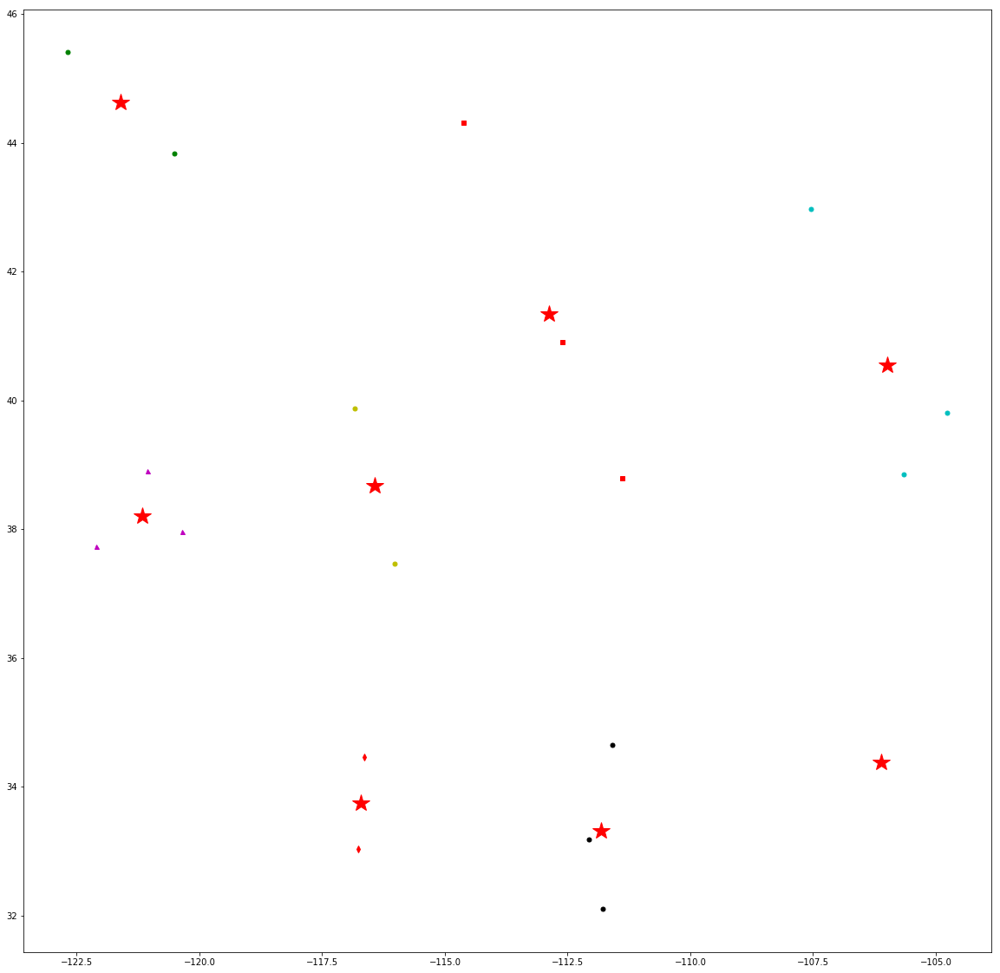

In [228]:
##绘制分类结果
mark = ['oc', 'oy', 'og', 'ok', '^m', '+r', 'sr', 'dr', '<r', 'pr']
plt.figure(figsize=(20,20))
color = 0
j = 0 
for i in labels:
    plt.plot([np.array(Coords)[j:j+1,0]], [np.array(Coords)[j:j+1,1]], mark[i], markersize = 5)
    j +=1
plt.plot([np.array(cluster_centriods)[:,0]],[np.array(cluster_centriods)[:,1]],color='red',marker='*',ms=20)
plt.show()

### 地图矢量绘制

In [519]:
labels[0]

1

In [522]:
group1=[]
group2=[]
group3=[]
for i in range(0,len(df_area.poly_centroid)):
    if labels[i] == 0:
        group1.append(df_area.poly_centroid[i])
    elif labels[i] == 1:
        group2.append(df_area.poly_centroid[i])
    else:
        group3.append(df_area.poly_centroid[i])

In [526]:
type(group1)

list

(20, 80)

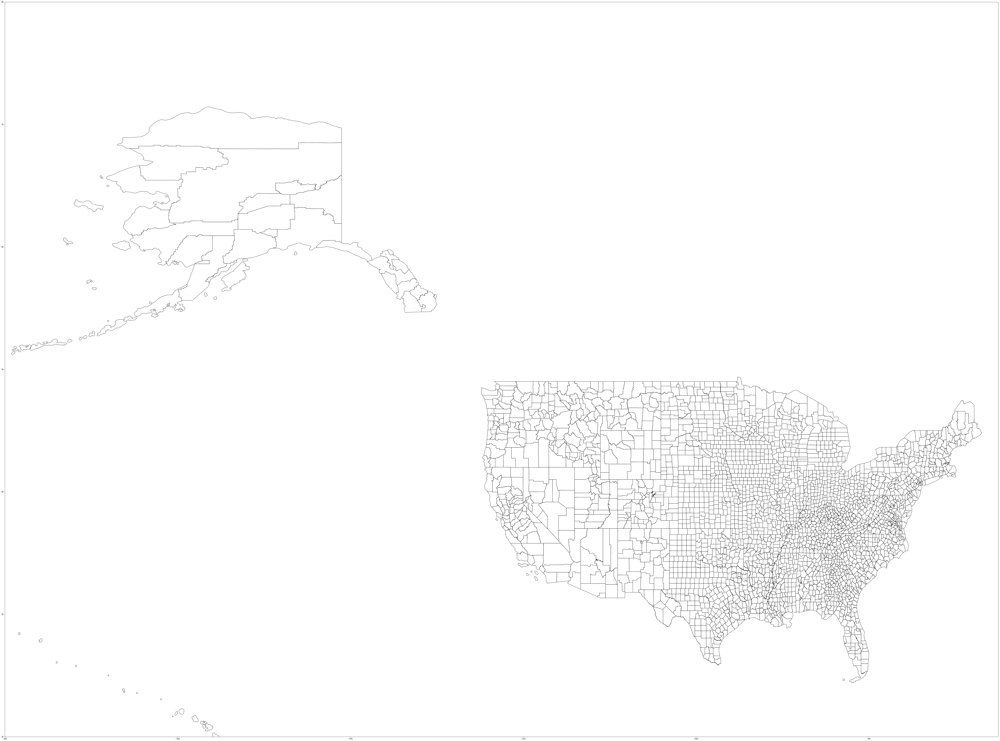

In [509]:
ax=df_area.plot(color='white',edgecolor='black',figsize=(100,100))
plt.xlim(-180,-65)
plt.ylim(20,80)
plt.show()


#df_area['geometry'].plot(ax=ax)

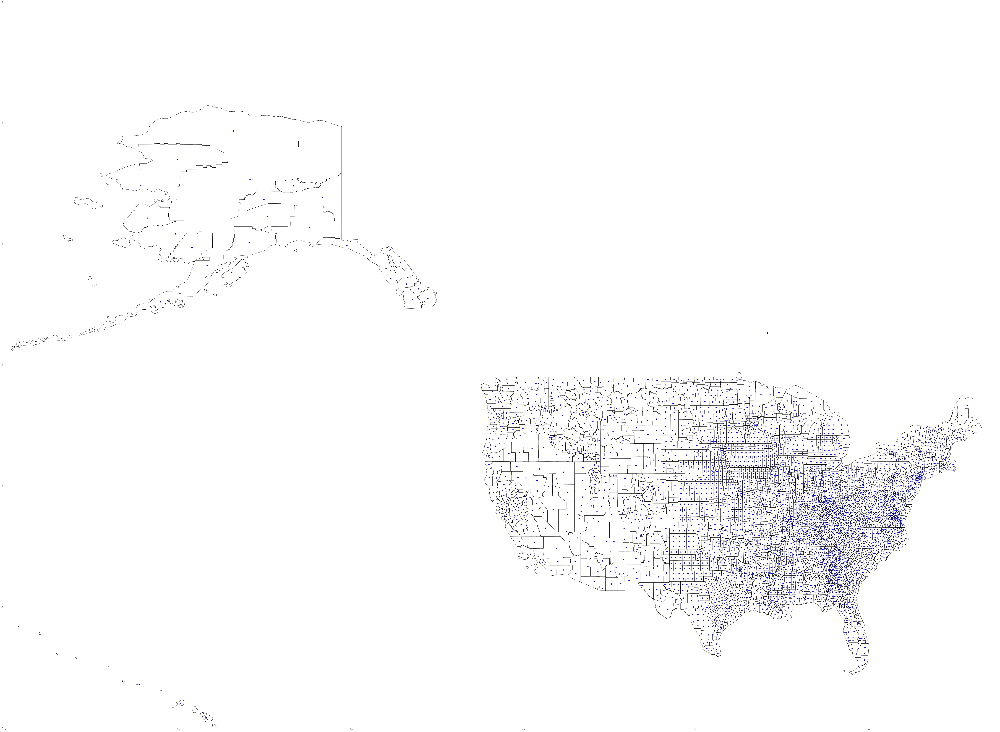

In [497]:



df_area['poly_centroid'].plot(ax=ax,color='blue')
plt.xlim(-180,-65)
plt.ylim(20,80)
plt.show()



In [ ]:

a=np.where(labels==2)
a

In [456]:
from array import array
index(labels==0)

NameError: name 'index' is not defined

In [397]:
np.array(Coords).shape

(3143, 2)

In [45]:
np.array(cluster_centriods)[:,0]

array([ -82.3451705 , -119.91729356,  -96.74719765])

In [477]:
Coords[0,1]

TypeError: list indices must be integers or slices, not tuple

转换为点画图

In [ ]:
from shapely import geometry as geo
cluster_pt=[]
for i in range(0,len(cluster_centriods)):
    cluster_pt.append(geo.Point(cluster_centriods[i])) 
